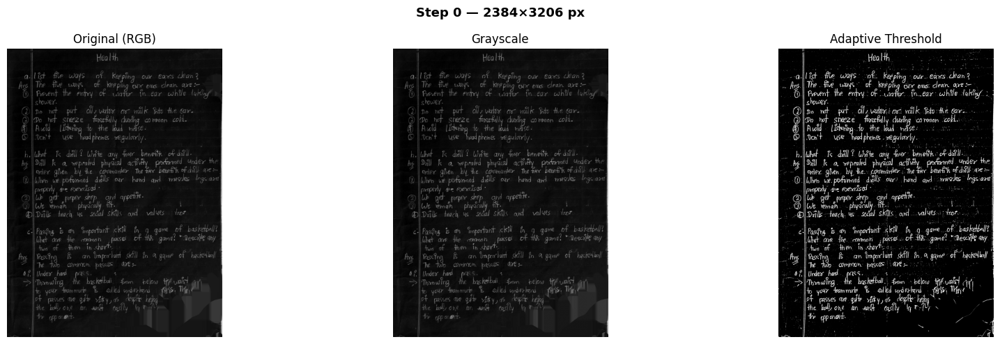

2384×3206 px  |  ink coverage: 8.9%


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from collections import defaultdict
import os, json, math
import torch
from transformers import ViTModel, ViTImageProcessor
import pytesseract

pytesseract.pytesseract.tesseract_cmd = r"C:/Program Files/Tesseract-OCR/tesseract.exe"


IMAGE_PATH = "pp/bin.png"      # ← your image
OUTPUT_DIR = "output_chars"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ── ViT ───────────────────────────────────────────────────────────────────────
VIT_MODEL_NAME = "google/vit-base-patch16-224"
PATCH_SIZE     = 16
DISCARD_RATIO  = 0.9      # rollout sparsification (fraction zeroed per layer)
HEAD_FUSION    = "mean"   # "mean" | "max" | int

# ── Line segmentation ─────────────────────────────────────────────────────────
LINE_T     = 20.0   # row-projection threshold: mean ink value that signals a text row
MIN_LINE_H = 10     # ignore line bands thinner than this (px)
LINE_PAD   = 4      # expand each line bbox top & bottom by this many px

# ── Word segmentation ─────────────────────────────────────────────────────────
WORD_GAP_T     = 8.0   # column-projection value below which a column is "silent"
WORD_GAP_MIN_W = 6     # a silence run must be ≥ this wide (px) to split a word
MIN_WORD_W     = 8     # discard word segments narrower than this (px)
MERGE_K        = 5     # smoothing kernel width for column projection
WORD_PAD       = 10    # expand each word bbox on all 4 sides (px)

# ── OCR ───────────────────────────────────────────────────────────────────────
OCR_SCALE_F = 6     # upscale word crop before Tesseract
MIN_OCR_DIM = 3     # discard OCR boxes with width or height below this (px)
CHAR_PAD    = 5     # expand every OCR char bbox by this many px on all sides

# ── Mask / CC ─────────────────────────────────────────────────────────────────
MIN_CC_AREA = 12    # components smaller than this are always noise (px²)
# ═══════════════════════════════════════════════════════════════════════════════

img_bgr  = cv2.imread(IMAGE_PATH)
assert img_bgr is not None, f"Cannot load: {IMAGE_PATH}"
img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
gray     = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
H, W     = gray.shape

clahe    = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
enhanced = clahe.apply(gray)

binary   = cv2.adaptiveThreshold(
    gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 31, -5
)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].imshow(img_rgb);             axes[0].set_title("Original (RGB)");     axes[0].axis('off')
axes[1].imshow(gray,    cmap='gray'); axes[1].set_title("Grayscale");          axes[1].axis('off')
axes[2].imshow(binary,  cmap='gray'); axes[2].set_title("Adaptive Threshold"); axes[2].axis('off')
plt.suptitle(f"Step 0 — {W}×{H} px", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print(f"{W}×{H} px  |  ink coverage: {(binary==255).mean()*100:.1f}%")

Loading google/vit-base-patch16-224 ...


Loading weights: 100%|██████████| 198/198 [00:00<00:00, 5278.60it/s]
ViTModel LOAD REPORT from: google/vit-base-patch16-224
Key               | Status     |  | 
------------------+------------+--+-
classifier.bias   | UNEXPECTED |  | 
classifier.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


ViT ready.
Global score range: 0.000 – 1.000


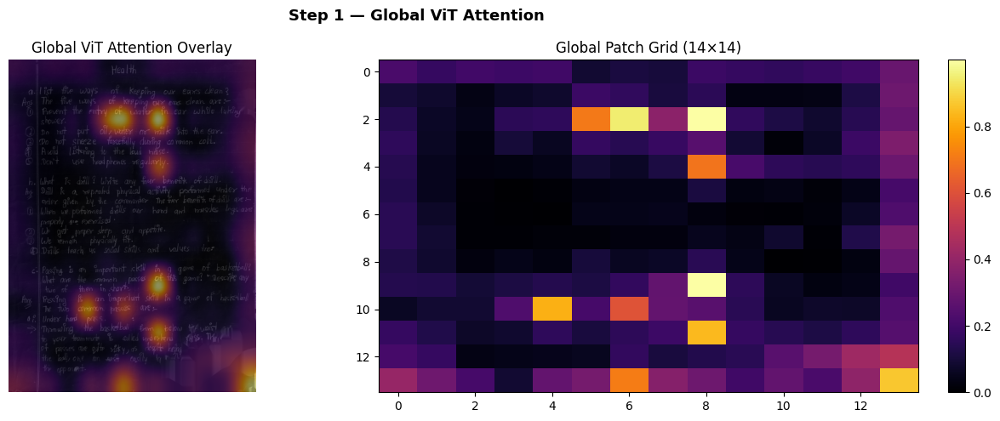

In [11]:
print(f"Loading {VIT_MODEL_NAME} ...")
vit_proc  = ViTImageProcessor.from_pretrained(VIT_MODEL_NAME)
vit_model = ViTModel.from_pretrained(
    VIT_MODEL_NAME, output_attentions=True, add_pooling_layer=False
)
vit_model.eval()
print("ViT ready.")


def attention_rollout(attentions):
    """Abnar & Zuidema (2020) rollout. Returns (T, T) matrix."""
    T      = attentions[0].size(-1)
    result = torch.eye(T)
    for attn in attentions:
        a  = attn.squeeze(0)          # (heads, T, T)
        af = a.mean(0) if HEAD_FUSION == "mean" else (
             a.max(0).values if HEAD_FUSION == "max" else a[HEAD_FUSION])
        flat   = af.view(-1)
        thresh = flat.quantile(DISCARD_RATIO)
        af[af < thresh] = 0
        af = af + torch.eye(T)
        af = af / af.sum(-1, keepdim=True)
        result = torch.matmul(af, result)
    return result


def vit_patch_scores_for_image(rgb_array):
    """
    rgb_array : (H, W, 3) uint8
    Returns   : patch_scores (14,14) float32 [0,1],
                attention_map (H, W) float32 [0,1]
    """
    h, w   = rgb_array.shape[:2]
    pil    = Image.fromarray(rgb_array)
    inp    = vit_proc(images=pil, return_tensors="pt")
    with torch.no_grad():
        out = vit_model(**inp, output_attentions=True)
    roll     = attention_rollout(out.attentions)
    cls_attn = roll[0, 1:].numpy()                         # (196,)
    side     = int(math.isqrt(cls_attn.shape[0]))          # 14
    ps       = cls_attn.reshape(side, side).astype(np.float32)
    ps       = (ps - ps.min()) / (ps.max() - ps.min() + 1e-8)
    amap     = cv2.resize(ps, (w, h), interpolation=cv2.INTER_CUBIC)
    return ps, amap


# ── Global pass (overview only) ───────────────────────────────────────────────
ps_global, amap_global = vit_patch_scores_for_image(img_rgb)
print(f"Global score range: {ps_global.min():.3f} – {ps_global.max():.3f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].imshow(img_rgb)
axes[0].imshow(amap_global, cmap='inferno', alpha=0.55)
axes[0].set_title("Global ViT Attention Overlay"); axes[0].axis('off')
axes[1].imshow(ps_global, cmap='inferno', aspect='auto')
axes[1].set_title("Global Patch Grid (14×14)")
plt.colorbar(axes[1].images[0], ax=axes[1], fraction=0.046)
plt.suptitle("Step 1 — Global ViT Attention", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

Lines: 25
Words: 322


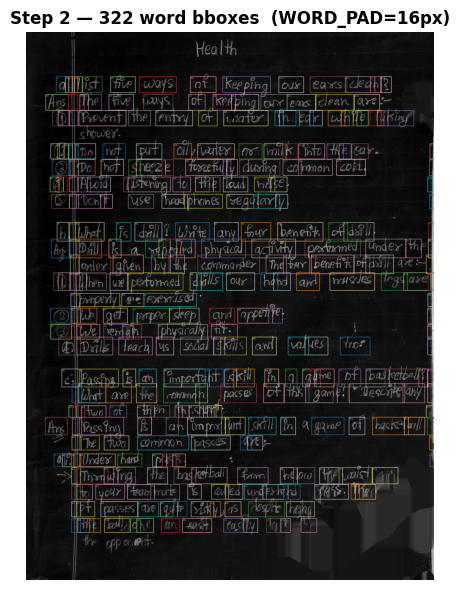

In [23]:
# ── Lines ─────────────────────────────────────────────────────────────────────
pixel_row  = binary.mean(axis=1)
line_bands = []
in_line = False
start   = 0
for y in range(H):
    if not in_line and pixel_row[y] > LINE_T:
        in_line = True;  start = y
    elif in_line and pixel_row[y] <= LINE_T:
        in_line = False
        if (y - start) >= MIN_LINE_H:
            line_bands.append((max(0, start-LINE_PAD), min(H, y+LINE_PAD)))
if in_line and (H - start) >= MIN_LINE_H:
    line_bands.append((max(0, start-LINE_PAD), H))

print(f"Lines: {len(line_bands)}")


# --- Words ─────────────────────────────────────────────────────────────────────
def detect_words(binary_full, ly0, ly1):
    """Return (x0,x1) word spans (pre-padding) within the given line band."""
    kernel     = np.ones(MERGE_K) / MERGE_K
    strip      = binary_full[ly0:ly1, :]
    col_proj   = strip.mean(axis=0)
    col_smooth = np.convolve(col_proj, kernel, mode='same')
    above      = col_smooth > WORD_GAP_T

    runs = []
    in_run = False;  rx = 0
    for x in range(W):
        if not in_run and above[x]:       in_run = True;  rx = x
        elif in_run and not above[x]:     in_run = False; runs.append((rx, x))
    if in_run: runs.append((rx, W))

    # merge runs whose gap is narrower than WORD_GAP_MIN_W
    if not runs: return []
    merged = [list(runs[0])]
    for a, b in runs[1:]:
        if (a - merged[-1][1]) < WORD_GAP_MIN_W:
            merged[-1][1] = b
        else:
            merged.append([a, b])
    return [(x0, x1) for x0, x1 in merged if (x1-x0) >= MIN_WORD_W]


# all_words: (li, wi, x0, y0, x1, y1)  — already expanded
all_words = []
for li, (ly0, ly1) in enumerate(line_bands):
    # Keep track of words per line for proper indexing in visualization
    word_counter = 0 
    for wi, (wx0, wx1) in enumerate(detect_words(binary, ly0, ly1)):
        
        # 1. Calculate the padded bounding box coordinates
        x0 = max(0, wx0 - WORD_PAD)
        y0 = max(0, ly0 - WORD_PAD)
        x1 = min(W, wx1 + WORD_PAD)
        y1 = min(H, ly1 + WORD_PAD)
        
        # 2. Extract the region from the binary image
        word_region = binary[y0:y1, x0:x1]
        
        # 3. Check the black pixel ratio
        # (Assuming black pixels are 0 and foreground/ink is > 0)
        total_pixels = word_region.size
        black_pixels = np.sum(word_region == 0)
        black_ratio = black_pixels / total_pixels
        
        if black_ratio > 0.90:
            continue  # Skip this word if it's more than 90% black
            
        all_words.append((li, word_counter, x0, y0, x1, y1))
        word_counter += 1

print(f"Words: {len(all_words)}")

vis = img_rgb.copy()
cmap20 = plt.cm.tab20.colors
for li, wi, x0, y0, x1, y1 in all_words:
    col = tuple(int(v*255) for v in cmap20[(li*5+wi) % 20][:3])
    cv2.rectangle(vis, (x0,y0), (x1,y1), col, 2)
    cv2.putText(vis, f"W{wi+1}", (x0+2, y0+13),
                cv2.FONT_HERSHEY_SIMPLEX, 0.38, col, 1)
plt.figure(figsize=(16, 6))
plt.imshow(vis)
plt.title(f"Step 2 — {len(all_words)} word bboxes  (WORD_PAD={WORD_PAD}px)",
          fontsize=12, fontweight='bold')
plt.axis('off'); plt.tight_layout(); plt.show()

Running per-word ViT on 322 words...
  [  1/322] L1·W1  75×93px  score 0.000–1.000
  [  2/322] L1·W2  42×93px  score 0.000–1.000
  [  3/322] L1·W3  54×93px  score 0.000–1.000
  [  4/322] L1·W4  47×93px  score 0.000–1.000
  [  5/322] L1·W5  117×93px  score 0.000–1.000
  [  6/322] L1·W6  144×93px  score 0.000–1.000
  [  7/322] L1·W7  216×93px  score 0.000–1.000
  [  8/322] L1·W8  150×93px  score 0.000–1.000
  [  9/322] L1·W9  279×93px  score 0.000–1.000
  [ 10/322] L1·W10  145×93px  score 0.000–1.000
  [ 11/322] L1·W11  215×93px  score 0.000–1.000
  [ 12/322] L1·W12  173×93px  score 0.000–1.000
  [ 13/322] L1·W13  65×93px  score 0.000–1.000
  [ 14/322] L1·W14  62×93px  score 0.000–1.000
  [ 15/322] L2·W1  133×92px  score 0.000–1.000
  [ 16/322] L2·W2  54×92px  score 0.000–1.000
  [ 17/322] L2·W3  50×92px  score 0.000–1.000
  [ 18/322] L2·W4  100×92px  score 0.000–1.000
  [ 19/322] L2·W5  144×92px  score 0.000–1.000
  [ 20/322] L2·W6  171×92px  score 0.000–1.000
  [ 21/322] L2·W7  96×92px

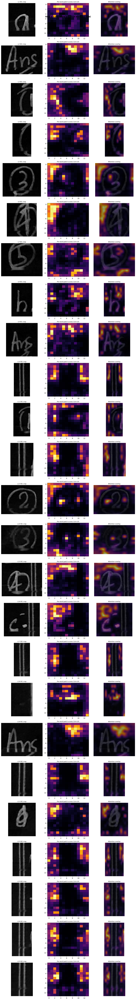

In [24]:
word_vit = {}   # (li,wi) → {'ps': (14,14), 'amap': (crop_h, crop_w)}

print(f"Running per-word ViT on {len(all_words)} words...")
for idx, (li, wi, x0, y0, x1, y1) in enumerate(all_words):
    crop = img_rgb[y0:y1, x0:x1]
    if crop.size == 0: continue
    ps, amap = vit_patch_scores_for_image(crop)
    word_vit[(li, wi)] = {'ps': ps, 'amap': amap}
    print(f"  [{idx+1:>3}/{len(all_words)}] L{li+1}·W{wi+1}  "
          f"{x1-x0}×{y1-y0}px  score {ps.min():.3f}–{ps.max():.3f}")

print("Done.")

# ── Show first word per line ───────────────────────────────────────────────────
seen = set()
samples = [e for e in all_words if e[0] not in seen and not seen.add(e[0])]

if samples:
    fig, axg = plt.subplots(len(samples), 3, figsize=(12, 3.5*len(samples)))
    if len(samples) == 1: axg = [axg]
    for row, (li, wi, x0, y0, x1, y1) in enumerate(samples):
        key  = (li, wi)
        crop = img_rgb[y0:y1, x0:x1]
        ps   = word_vit[key]['ps']
        amap = word_vit[key]['amap']
        axg[row][0].imshow(crop);                            axg[row][0].set_title(f"L{li+1}·W{wi+1} crop", fontsize=9);     axg[row][0].axis('off')
        axg[row][1].imshow(ps, cmap='inferno', aspect='auto'); axg[row][1].set_title("Per-word patch scores (14×14)", fontsize=9)
        axg[row][2].imshow(crop); axg[row][2].imshow(amap, cmap='inferno', alpha=0.6)
        axg[row][2].set_title("Attention overlay", fontsize=9); axg[row][2].axis('off')
    plt.suptitle("Step 3 — Per-word ViT (first word per line)",
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()

## OCR FROM HERE


Total OCR characters: 924
  L1·W1  'e'  (1 chars)
  L1·W2  'e'  (1 chars)
  L1·W3  'i'  (1 chars)
  L1·W4  '['  (1 chars)
  L1·W5  'igh.'  (4 chars)
  L1·W6  'Tie'  (3 chars)
  L1·W7  'UsQyS'  (5 chars)
  L1·W8  'rene'  (4 chars)
  L1·W9  'Keepthg'  (7 chars)
  L1·W10  'our'  (3 chars)
  L1·W11  'Cams.'  (5 chars)
  L1·W12  'Aa'  (2 chars)
  L1·W13  'rh'  (2 chars)
  L1·W14  'ie.'  (3 chars)
  L2·W1  'Hes.'  (4 chars)
  L2·W2  'it'  (2 chars)
  L2·W3  'q'  (1 chars)
  L2·W4  'ne'  (2 chars)
  L2·W5  'me'  (2 chars)
  L2·W6  'Mays.'  (5 chars)
  L2·W7  'or'  (2 chars)
  L2·W8  'Kee,'  (4 chars)
  L2·W9  '‘ping:'  (6 chars)
  L2·W10  'oh'  (2 chars)
  L2·W11  'eas'  (3 chars)
  L2·W12  'dean'  (4 chars)
  L2·W13  'art'  (3 chars)
  L3·W1  '('  (1 chars)
  L3·W2  'r'  (1 chars)
  L3·W3  '|'  (1 chars)
  L3·W4  'Pevenyp'  (7 chars)
  L3·W5  'me'  (2 chars)
  L3·W6  'enpry.'  (6 chars)
  L3·W7  '6-0)'  (4 chars)
  L3·W8  'water'  (5 chars)
  L3·W9  '{'  (1 chars)
  L3·W10  'iia'  (3 chars)


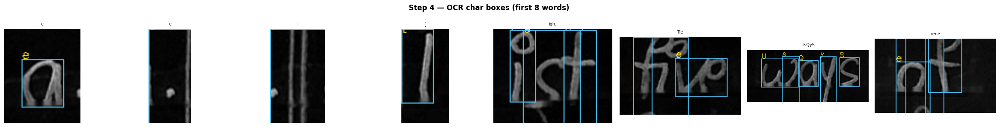

In [25]:
word_chars = {}   # (li,wi) → [(char, cx0,cy0,cx1,cy1) in word-crop coords]

for li, wi, wx0, wy0, wx1, wy1 in all_words:
    key       = (li, wi)
    crop_gray = enhanced[wy0:wy1, wx0:wx1]
    if crop_gray.size == 0:
        word_chars[key] = []; continue

    scaled = cv2.resize(crop_gray, None,
                        fx=OCR_SCALE_F, fy=OCR_SCALE_F,
                        interpolation=cv2.INTER_CUBIC)
    sh = scaled.shape[0]

    try:
        raw = pytesseract.image_to_boxes(scaled, config='--psm 8 --oem 1')
    except Exception as e:
        print(f"OCR failed L{li+1}·W{wi+1}: {e}")
        word_chars[key] = []; continue

    chars = []
    for line in raw.strip().split('\n'):
        parts = line.split()
        if len(parts) < 5: continue
        ch, x1t,y1t,x2t,y2t = parts[0], int(parts[1]),int(parts[2]),int(parts[3]),int(parts[4])
        # Tesseract: bottom-left origin → flip y, scale down to word-crop coords
        cx0 = x1t // OCR_SCALE_F;  cx1 = x2t // OCR_SCALE_F
        cy0 = (sh - y2t) // OCR_SCALE_F;  cy1 = (sh - y1t) // OCR_SCALE_F
        if (cx1-cx0) >= MIN_OCR_DIM and (cy1-cy0) >= MIN_OCR_DIM and ch.strip():
            chars.append((ch, cx0, cy0, cx1, cy1))
    word_chars[key] = chars

total = sum(len(v) for v in word_chars.values())
print(f"Total OCR characters: {total}")
for li, wi, *_ in all_words:
    key = (li,wi)
    txt = ''.join(c for c,*_ in word_chars.get(key,[]))
    print(f"  L{li+1}·W{wi+1}  '{txt}'  ({len(word_chars.get(key,[]))} chars)")

# Quick viz — first 8 words
n_show = min(len(all_words), 8)
if n_show:
    fig, axs = plt.subplots(1, n_show, figsize=(3*n_show, 3))
    if n_show == 1: axs = [axs]
    for i, (li,wi,wx0,wy0,wx1,wy1) in enumerate(all_words[:n_show]):
        crop = img_rgb[wy0:wy1, wx0:wx1].copy()
        for ch,cx0,cy0,cx1,cy1 in word_chars.get((li,wi),[]):
            cv2.rectangle(crop,(cx0,cy0),(cx1,cy1),(80,200,255),1)
            cv2.putText(crop,ch,(cx0,max(cy0-1,0)),cv2.FONT_HERSHEY_SIMPLEX,0.4,(255,220,0),1)
        axs[i].imshow(crop)
        axs[i].set_title(''.join(c for c,*_ in word_chars.get((li,wi),[])), fontsize=7)
        axs[i].axis('off')
    plt.suptitle("Step 4 — OCR char boxes (first 8 words)",
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()

In [26]:
def attn_score_for_region(word_ps, crop_h, crop_w, rx0, ry0, rx1, ry1):
    """
    Mean per-word ViT patch score over (rx0,ry0,rx1,ry1) in word-crop pixel coords.
    word_ps  : (14,14) patch scores for this word crop
    """
    ph, pw = word_ps.shape
    gx0 = max(0, int(rx0 / crop_w * pw))
    gy0 = max(0, int(ry0 / crop_h * ph))
    gx1 = min(pw, max(gx0+1, int(rx1 / crop_w * pw)))
    gy1 = min(ph, max(gy0+1, int(ry1 / crop_h * ph)))
    return float(word_ps[gy0:gy1, gx0:gx1].mean())


def extract_dominant_character(rgb_word, bin_word, word_ps,
                                cx0, cy0, cx1, cy1):
    """
    Crop the char bbox from rgb_word/bin_word, keep only the dominant CC,
    white-fill everything else.

    Returns the masked RGB crop, or None if no valid CC is found.
    """
    crop_h, crop_w = rgb_word.shape[:2]

    # Clamp to word crop bounds
    cx0 = max(0, cx0);  cy0 = max(0, cy0)
    cx1 = min(crop_w, cx1);  cy1 = min(crop_h, cy1)
    if cx1 <= cx0 or cy1 <= cy0:
        return None

    rgb_c = rgb_word[cy0:cy1, cx0:cx1].copy()
    bin_c = bin_word[cy0:cy1, cx0:cx1]

    # Foreground = ink pixels (adaptive threshold marks ink as 255)
    ink   = (bin_c > 128).astype(np.uint8) * 255
    n_lbl, labels, stats, _ = cv2.connectedComponentsWithStats(
        ink, connectivity=8
    )

    if n_lbl <= 1:          # nothing but background
        return rgb_c

    # Score every foreground CC
    best_label = -1
    best_score = -1.0
    for lbl in range(1, n_lbl):
        area = int(stats[lbl, cv2.CC_STAT_AREA])
        if area < MIN_CC_AREA:
            continue
        bx0 = int(stats[lbl, cv2.CC_STAT_LEFT])
        by0 = int(stats[lbl, cv2.CC_STAT_TOP])
        bw  = int(stats[lbl, cv2.CC_STAT_WIDTH])
        bh  = int(stats[lbl, cv2.CC_STAT_HEIGHT])
        # Map CC bbox back to word-crop coords for the ViT lookup
        attn  = attn_score_for_region(
            word_ps, crop_h, crop_w,
            cx0+bx0, cy0+by0, cx0+bx0+bw, cy0+by0+bh
        )
        score = area * attn          # combined: large AND attended
        if score > best_score:
            best_score = score
            best_label = lbl

    if best_label == -1:    # all CCs were noise
        return rgb_c

    # White-fill every ink pixel that does NOT belong to the winning CC
    keep_mask = (labels == best_label)     # True where we keep ink
    remove    = (ink > 0) & ~keep_mask    # ink present but not our char
    rgb_c[remove] = [0, 0, 0]

    return rgb_c


# ── Process every OCR character in every word ─────────────────────────────────
results = []   # list of dicts

for li, wi, wx0, wy0, wx1, wy1 in all_words:
    key   = (li, wi)
    chars = word_chars.get(key, [])
    vit   = word_vit.get(key)
    if not chars or vit is None:
        continue

    word_ps  = vit['ps']
    rgb_word = img_rgb[wy0:wy1, wx0:wx1]
    bin_word = binary [wy0:wy1, wx0:wx1]

    for ci, (ch, cx0, cy0, cx1, cy1) in enumerate(chars):
        # Expand char bbox
        ecx0 = cx0 - CHAR_PAD;  ecx1 = cx1 + CHAR_PAD
        ecy0 = cy0 - CHAR_PAD;  ecy1 = cy1 + CHAR_PAD

        masked = extract_dominant_character(
            rgb_word, bin_word, word_ps,
            ecx0, ecy0, ecx1, ecy1
        )
        if masked is None:
            continue

        results.append(dict(
            li=li, wi=wi, ci=ci, char=ch,
            masked_crop=masked,
            word_bbox=(wx0,wy0,wx1,wy1),
            char_bbox_in_word=(
                max(0,ecx0), max(0,ecy0),
                min(wx1-wx0,ecx1), min(wy1-wy0,ecy1)
            ),
        ))

print(f"Total clean character crops: {len(results)}")

Total clean character crops: 924


In [27]:
metadata = []
for r in results:
    ch_safe = r['char'] if r['char'].isalnum() else f"ord{ord(r['char'])}"
    fname   = f"L{r['li']+1:02d}_W{r['wi']+1:03d}_C{r['ci']+1:03d}_{ch_safe}.png"
    Image.fromarray(r['masked_crop']).save(os.path.join(OUTPUT_DIR, fname))
    metadata.append({
        'file': fname,
        'line': r['li']+1, 'word': r['wi']+1, 'char_idx': r['ci']+1,
        'char': r['char'],
        'word_bbox':          [int(v) for v in r['word_bbox']],
        'char_bbox_in_word':  [int(v) for v in r['char_bbox_in_word']],
    })

with open(os.path.join(OUTPUT_DIR, 'metadata.json'), 'w') as f:
    json.dump(metadata, f, indent=2)

print(f"Saved {len(results)} character crops → '{OUTPUT_DIR}/'")
print(f"metadata.json written\n")
print(f"{'File':<40}  {'L':>2}  {'W':>3}  {'C':>3}  char")
print('-' * 54)
for m in metadata[:25]:
    print(f"{m['file']:<40}  {m['line']:>2}  {m['word']:>3}  {m['char_idx']:>3}  {m['char']}")
if len(metadata) > 25:
    print(f"... and {len(metadata)-25} more")

Saved 924 character crops → 'output_chars/'
metadata.json written

File                                       L    W    C  char
------------------------------------------------------
L01_W001_C001_e.png                        1    1    1  e
L01_W002_C001_e.png                        1    2    1  e
L01_W003_C001_i.png                        1    3    1  i
L01_W004_C001_ord91.png                    1    4    1  [
L01_W005_C001_i.png                        1    5    1  i
L01_W005_C002_g.png                        1    5    2  g
L01_W005_C003_h.png                        1    5    3  h
L01_W005_C004_ord46.png                    1    5    4  .
L01_W006_C001_T.png                        1    6    1  T
L01_W006_C002_i.png                        1    6    2  i
L01_W006_C003_e.png                        1    6    3  e
L01_W007_C001_U.png                        1    7    1  U
L01_W007_C002_s.png                        1    7    2  s
L01_W007_C003_Q.png                        1    7    3  Q
L01_W

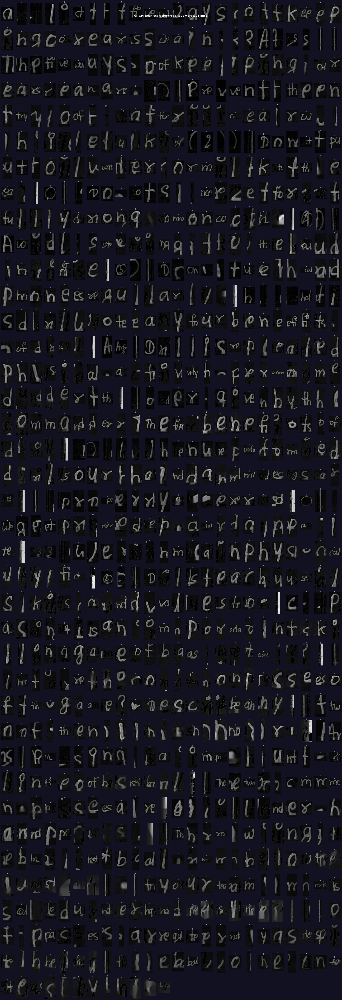

In [28]:
n     = len(results)
ncols = min(24, n)
nrows = (n + ncols - 1) // ncols

fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*1.0, nrows*1.8))
fig.patch.set_facecolor('#111122')
fig.suptitle(
    f"All {n} clean character crops  "
    f"({len(all_words)} words, {len(line_bands)} lines)",
    fontsize=13, fontweight='bold', color='white'
)
axs_flat = np.array(axs).flatten()

for i, r in enumerate(results):
    axs_flat[i].imshow(r['masked_crop'])
    axs_flat[i].set_title(
        f"{r['char']}", fontsize=7, color='#aaccff', pad=1
    )
    axs_flat[i].axis('off')

for j in range(n, len(axs_flat)):
    axs_flat[j].axis('off')

plt.tight_layout()
plt.show()